In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)
import os 
os.chdir("/content/drive/My Drive/Group_Project")

Mounted at /content/drive


In [ ]:
import numpy as np
import time
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
from torch.utils.data.sampler import SubsetRandomSampler
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import os
from tqdm import tqdm
from PIL import Image
import shutil
import tensorflow as tf
import matplotlib.animation as animation
from IPython.display import HTML
from google.colab import files

In [ ]:
#
data_path = "/content/drive/My Drive/Group_Project/GAN_Input2/"

In [ ]:
#Defining globals
SIZE = 64
default_batch_size = 64
default_lr = 2e-4
default_generator_lr = 2e-4
default_discriminator_lr = 2e-4
default_generator_feature_map_size = 64
default_discriminator_feature_map_size = 64
default_noise_dimension = 100
default_num_of_channels = 3 #Because it is colored image
default_num_epochs = 30
default_beta1 = 0.5
default_beta2 = 0.999
num_of_gpu = 1

In [ ]:
#if gpu is available, use gpu
state = "cpu"
if torch.cuda.is_available():
  state = "cuda"

device = torch.device(state)

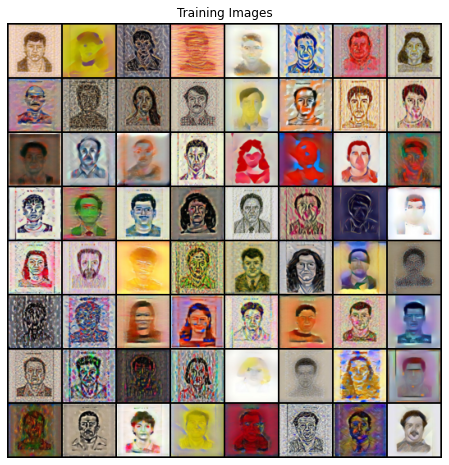

In [ ]:
#Load dataset using torchvision.datasets.imagefolder from the data_path
dataset = dset.ImageFolder(data_path,
                           transform=transforms.Compose([
                               transforms.Resize([SIZE,SIZE]),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))


#Set the data_loader
dataloader = torch.utils.data.DataLoader(dataset, shuffle=True, batch_size=default_batch_size)

# Plot some training images
training_images = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(training_images[0].cpu()[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [ ]:
#Use a class to define and store hyper-parameters
class HP():
  def __init__(self):
    self.batch_size = default_batch_size
    self.lr = default_lr
    self.beta1 = default_beta1
    self.beta2 = default_beta2
    self.num_epochs = default_num_epochs
    self.name = "bs:" + str(self.batch_size) + "_lr:" + str(self.lr) + "_b1:" + str(self.beta1) + "_b2:" + str(self.beta2) + "_ne:" + str(self.num_epochs)
  def __init__(self, batch_size=default_batch_size, lr=default_lr, beta1=default_beta1, beta2=default_beta2, num_epochs=default_num_epochs):
    self.batch_size = batch_size
    self.lr = lr
    self.beta1 = beta1
    self.beta2 = beta2
    self.num_epochs = num_epochs
    self.name = "bs:" + str(self.batch_size) + "_lr:" + str(self.lr) + "_b1:" + str(self.beta1) + "_b2:" + str(self.beta2) + "_ne:" + str(self.num_epochs)
  def setName(self):
    self.name = "bs:" + str(self.batch_size) + "_lr:" + str(self.lr) + "_b1:" + str(self.beta1) + "_b2:" + str(self.beta2) + "_ne:" + str(self.num_epochs)
default_HP = HP(default_batch_size, default_lr, default_beta1, default_beta2, default_num_epochs)

In [ ]:
# Custom weights initialization called on Generator and Discriminator
# The weights must be initialized randomly from a Normal distribution with mean=0, stdev=0.02 according to DCGAN paper
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [ ]:
class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.num_of_gpu = num_of_gpu
        self.name = "Generator"
        self.epochs_done = 0
        ngf = default_generator_feature_map_size
        self.gene = nn.Sequential(
            # Input the noise going towards a convolution map
            nn.ConvTranspose2d(default_noise_dimension, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d(ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d(ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d(ngf, default_num_of_channels, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (default_num_of_channels) x 64 x 64
        )

    def forward(self, x):
        return self.gene(x)

In [ ]:
# Create the generator
def create_generator():
  generator = Generator().to(device)

  # Handle multi-gpu if desired
  if (device.type == 'cuda') and (num_of_gpu > 1):
      generator = nn.DataParallel(generator, list(range(num_of_gpu)))

  # Apply the weights_init function to randomly initialize all weights
  #  to mean=0, stdev=0.02.
  generator.apply(weights_init)

  return generator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.ngpu = num_of_gpu
        self.name = "Discriminator"
        self.epochs_done = 0
        ndf = default_discriminator_feature_map_size
        self.disc = nn.Sequential(
            # input is (ndf) x 64 x 64
            nn.Conv2d(default_num_of_channels, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
        )

    def forward(self, x):
        return self.disc(x)

In [ ]:
# Create the Discriminator
def create_discriminator():
  discriminator = Discriminator().to(device)

  # Handle multi-gpu if desired
  if (device.type == 'cuda') and (num_of_gpu > 1):
      discriminator = nn.DataParallel(discriminator, list(range(num_of_gpu)))

  # Apply the weights_init function to randomly initialize all weights
  #  to mean=0, stdev=0.2.
  discriminator.apply(weights_init)

  return discriminator

In [ ]:
def download_model_state(path):
  files.download(path)

In [ ]:
htmls_path = "/content/htmls"
pdfs_path = "/content/pdfs"
generators_path = "/content/generators"
discriminators_path = "/content/discriminators"

In [ ]:
def train(generator, discriminator, hp=default_HP, first_time=True, additional_epochs=0):

  #Set up the hyperparameters by using the general class HP
  batch_size = hp.batch_size
  lr = hp.lr
  beta1 = hp.beta1
  beta2 = hp.beta2
  num_epochs = hp.num_epochs

  # These arrays will show how our model progresses
  img_list = []
  generator_losses = []
  discriminator_losses = []
  iters = 0

  # Use BCEWithLogitsLoss function in order to prevent exploding/diminishing gradient
  criterion = nn.BCEWithLogitsLoss()

  # Create batch of latent vectors that we will use to visualize
  #  the progression of the generator
  fixed_noise = torch.randn(64, default_noise_dimension, 1, 1, device=device)

  # Uses 1 and 0 for real and fake images
  real_label = 1.
  fake_label = 0.

  # Using Adam optimizer because it is faster
  optimizerD = optim.Adam(discriminator.parameters(), lr=lr, betas=(beta1, beta2))
  optimizerG = optim.Adam(generator.parameters(), lr=lr, betas=(beta1, beta2))

  generator = generator.to(device)
  discriminator = discriminator.to(device)

  print("Training Starts")
  epoch = 0
  if not first_time:
    epoch = num_epochs-additional_epochs
    generator.epochs_done = epoch
    discriminator.epochs_done = epoch
  while epoch < num_epochs:
      for i, data in enumerate(dataloader, 0):
         
          # Updating Discriminator
          # Clean up the gradient first 
          discriminator.zero_grad()
          # Format batch
          real_cpu = data[0].to(device)
          b_size = real_cpu.size(0)
          #Fill the label with 
          label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
          # Forward pass real batch through D
          output = discriminator(real_cpu).view(-1)
          # Calculate loss for real batch of images
          errD_real = criterion(output, label)
          # Update parameters for discriminator
          errD_real.backward()
          D_x = output.mean().item()

          ## Train with all-fake batch
          # Generate batch of latent vectors
          noise = torch.randn(b_size, default_noise_dimension, 1, 1, device=device)
          # Generate fake image batch with G
          fake = generator(noise)
          label.fill_(fake_label)
          # Classify all fake batch with D
          output = discriminator(fake.detach().to(device)).view(-1)
          # Calculate D's loss on the all-fake batch
          errD_fake = criterion(output, label)
          # Calculate the gradients for this batch, accumulated (summed) with previous gradients
          errD_fake.backward()
          D_G_z1 = output.mean().item()
          # Compute error of D as sum over the fake and the real batches
          errD = errD_real + errD_fake
          # Update D
          optimizerD.step()

          # Updating Generator 
          generator.zero_grad()
          label.fill_(real_label)  # fake labels are real for generator cost
          # Since we just updated D, perform another forward pass of all-fake batch through D
          output = discriminator(fake).view(-1)
          # Calculate G's loss based on this output
          errG = criterion(output, label)
          # Calculate gradients for G
          errG.backward()
          D_G_z2 = output.mean().item()
          # Update G
          optimizerG.step()

          # Output training stats
          if i % 100 == 0:
              print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                    % (epoch, num_epochs, i, len(dataloader),
                      errD.item(), errG.item()))

          # Save Losses for plotting later
          generator_losses.append(errG.item())
          discriminator_losses.append(errD.item())

          # Check how the generator is doing by saving G's output on fixed_noise
          if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
              with torch.no_grad():
                  fake = generator(fixed_noise).detach().cpu()
              img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

          iters += 1
      generator.epochs_done += 1
      discriminator.epochs_done += 1
      epoch += 1
  if not os.path.isdir(generators_path):
    ! mkdir /content/generators
  if not os.path.isdir(discriminators_path):
    ! mkdir /content/discriminators
  g_path = "{0}/{1}_bs_{2}_lr_{3}_b1_{4}_b2_{5}_epoch_{6}".format(generators_path, generator.name, batch_size, lr, beta1, beta2, generator.epochs_done)
  torch.save(generator.state_dict(), g_path)
  d_path = "{0}/{1}_bs_{2}_lr_{3}_b1_{4}_b2_{5}_epoch_{6}".format(discriminators_path, discriminator.name, batch_size, lr, beta1, beta2, discriminator.epochs_done)
  torch.save(discriminator.state_dict(), d_path)
  download_model_state(g_path)
  #download_model_state(d_path)
  return generator_losses, discriminator_losses, img_list

In [ ]:
def plot_training_curves(generator_losses, discriminator_losses, hp=default_HP):
  plt.figure(figsize=(10,5))
  plt.title("Generator and Discriminator Loss During Training")
  plt.plot(generator_losses,label="G")
  plt.plot(discriminator_losses,label="D")
  plt.xlabel("iterations")
  plt.ylabel("Loss")
  plt.legend()
  pdf_name = hp.name + ".pdf"
  plt.savefig(pdf_name)
  files.download(pdf_name)
  if not os.path.isdir(pdfs_path):
    ! mkdir /content/pdfs
  shutil.move(pdf_name, pdfs_path)
  plt.show()

In [ ]:
def save_progression(img_list, hp):
  #%%capture
  fig = plt.figure(figsize=(8,8))
  plt.axis("off")
  ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
  ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

  html = HTML(ani.to_jshtml())
  data = html.data
  html_string = "afg_" + hp.name + ".html"
  with open(html_string, 'w') as f:
    f.write(data)
  #Download to local laptop
  files.download(html_string)
  #Move html to runtime directory
  if not os.path.isdir(htmls_path):
    ! mkdir /content/htmls
  shutil.move(html_string, htmls_path)
  display(html)

In [ ]:
def compare_real_fake(img_list):
  # Grab a batch of real images from the dataloader
  real_batch = next(iter(dataloader))

  # Plot the real images
  plt.figure(figsize=(15,15))
  plt.subplot(1,2,1)
  plt.axis("off")
  plt.title("Real Images")
  plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

  # Plot the fake images from the last epoch
  plt.subplot(1,2,2)
  plt.axis("off")
  plt.title("Fake Images")
  plt.imshow(np.transpose(img_list[-1],(1,2,0)))
  plt.show()

In [ ]:
def train_plot_save_show(generator, discriminator, hp=default_HP, first_time=True, additional_epochs=0):
  generator_losses, discriminator_losses, img_list = train(generator, discriminator, hp, first_time, additional_epochs)
  plot_training_curves(generator_losses, discriminator_losses, hp)
  save_progression(img_list, hp)
  compare_real_fake(img_list)
  return generator, discriminator, generator_losses, discriminator_losses, img_list

In [ ]:
def generate_show_fake(generator):
  random_noise = torch.randn(64, default_noise_dimension, 1, 1, device=device)
  fake = generator(random_noise.cpu()).detach().cpu()
  i = vutils.make_grid(fake, padding=2, normalize=True)

  plt.figure(figsize=(8,8))
  plt.imshow(np.transpose(i,(1,2,0)))
  plt.show()

In [ ]:
def load_generator(hp):
  path = "/content/generators/Generator_bs_{0}_lr_{1}_b1_{2}_b2_{3}_epoch_{4}".format(hp.batch_size, hp.lr, hp.beta1, hp.beta2, hp.num_epochs)
  state = torch.load(path)
  generator = Generator()
  generator.load_state_dict(state)
  return generator

In [ ]:
def load_discriminator(hp):
  path = "/content/discriminators/Discriminator_bs_{0}_lr_{1}_b1_{2}_b2_{3}_epoch_{4}".format(hp.batch_size, hp.lr, hp.beta1, hp.beta2, hp.num_epochs)
  state = torch.load(path)
  discriminator = Discriminator()
  discriminator.load_state_dict(state)
  return discriminator

In [ ]:
def train_download_HP(hp=default_HP):
  generator = create_generator()
  discriminator = create_discriminator()
  generator, discriminator, generator_losses, discriminator_losses, img_list = train_plot_save_show(generator, discriminator, hp)

Training Starts
[0/200][0/36]	Loss_D: 1.4171	Loss_G: 2.1162
[1/200][0/36]	Loss_D: 2.2942	Loss_G: 7.4279
[2/200][0/36]	Loss_D: 3.7312	Loss_G: 10.9115
[3/200][0/36]	Loss_D: 5.2904	Loss_G: 11.5759
[4/200][0/36]	Loss_D: 0.8569	Loss_G: 5.8049
[5/200][0/36]	Loss_D: 0.7581	Loss_G: 7.5386
[6/200][0/36]	Loss_D: 1.6651	Loss_G: 2.5957
[7/200][0/36]	Loss_D: 2.6342	Loss_G: 6.4761
[8/200][0/36]	Loss_D: 0.8374	Loss_G: 3.6847
[9/200][0/36]	Loss_D: 3.9597	Loss_G: 5.9751
[10/200][0/36]	Loss_D: 4.9948	Loss_G: 8.3150
[11/200][0/36]	Loss_D: 0.8543	Loss_G: 4.2632
[12/200][0/36]	Loss_D: 2.0861	Loss_G: 3.3272
[13/200][0/36]	Loss_D: 0.9125	Loss_G: 2.3358
[14/200][0/36]	Loss_D: 1.6348	Loss_G: 7.6745
[15/200][0/36]	Loss_D: 0.8247	Loss_G: 2.2094
[16/200][0/36]	Loss_D: 4.9790	Loss_G: 5.7748
[17/200][0/36]	Loss_D: 1.7108	Loss_G: 6.6387
[18/200][0/36]	Loss_D: 1.6606	Loss_G: 6.0328
[19/200][0/36]	Loss_D: 2.8802	Loss_G: 4.9259
[20/200][0/36]	Loss_D: 2.2489	Loss_G: 5.2374
[21/200][0/36]	Loss_D: 4.7923	Loss_G: 3.6672
[2

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

shell-init: error retrieving current directory: getcwd: cannot access parent directories: No such file or directory


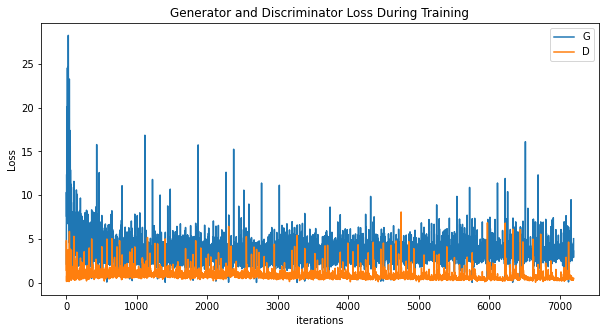

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

shell-init: error retrieving current directory: getcwd: cannot access parent directories: No such file or directory


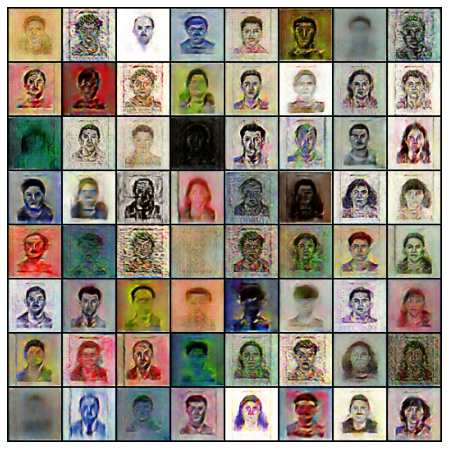

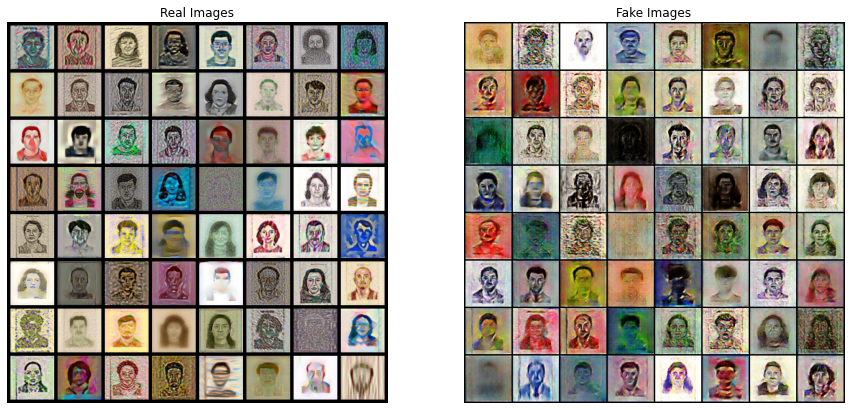

In [ ]:
train_download_HP(hp=HP(batch_size=128, lr=3e-4, num_epochs=200))

In [ ]:
train_download_HP(hp=HP(batch_size=128, lr=3e-4, num_epochs=200))